<a href="https://colab.research.google.com/github/AeMcRa/Datascience-things/blob/main/AedaRamoU8proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install preliz

In [ ]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import preliz as pz
import seaborn as sns
from itertools import combinations

In [ ]:
!pip install pymc-bart
import pymc_bart as pmb

# Predicting steam game style density
Steam is the largest PC games marketplace, and so it is a good source of data about general game trends. I want to see how the density of game types changes over the years, which I will do by measuring the number of games with a given tag pair(more on this later) per year. The idea is that by using data from games released around the same time period, one can predict how much a given game will appear. For example, if a really good roguelike card-battler comes out, then people will try to emulate that success and more roguelike card-battlers will be released soon after.

I started by downloading the entire steam library.
there are over 140000 entries here. Its fine.

I then started cleaning. I removed any games that didnt have a listed date, games below 10 reviews, as well as any tags that I determined were not applicable to gameplay type. This cut down the tags from over 500 to less than 200. Since we are looking at tag pairs, the more tags we have the longer the model will take. I spent like 8 hours doing this cleaning.

In [ ]:
#steam = pd.read_csv('https://raw.githubusercontent.com/AeMcRa/Datascience-things/refs/heads/main/insights_no_invalid_dates_tags.csv').dropna()
steam = pd.read_csv('https://raw.githubusercontent.com/AeMcRa/Datascience-things/refs/heads/main/insights_tags_filtered_v5.csv').dropna()
for col in ['initial_price', 'review_score', 'total']:
  steam = steam[steam[col] !='\\N']
  steam[col] = steam[col].astype(float)

<ipython-input-4-d7513f46fd8e>:2: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  steam = pd.read_csv('https://raw.githubusercontent.com/AeMcRa/Datascience-things/refs/heads/main/insights_tags_filtered_v5.csv').dropna()


In [ ]:
steam.shape

(70249, 9)

In [ ]:
steam = steam[steam.total >=10]

In [ ]:
steam.shape

(45908, 9)

In [ ]:
set(steam.review_score)

{1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0}

# More data cleaning
now that we have all the 'bad' entries removed, it's time to actually build the dataframe. I used a bunch of for loops to build this dataframe from  scratch. I am using tag pairs because games tend to be described as as combination of two things. Think 'roguelike card-battler' or '2D-platformer farming simulator' hence, pairs are a pretty good metric for determining game archetype

In [ ]:
yearStats = {}

# Iterate through each row in the DataFrame.
for index, row in steam.iterrows():
    # Extract the release year from the 'release_date' field.
    year = row['release_date'].split('-')[0]

    # Ensure the year key exists.
    if year not in yearStats:
        yearStats[year] = {}

    # Split and clean the tag string (assuming comma-separated tags).
    tags = [tag.strip() for tag in row['tag'].split(',')]

    # Update statistics for each tag.
    for tag in tags:
        if tag not in yearStats[year]:
            yearStats[year][tag] = {
                'count': 0,
                'total_review_score': 0,
                'sum_total_reviews': 0
            }
        # Update counts and cumulative sums.
        yearStats[year][tag]['count'] += 1
        yearStats[year][tag]['total_review_score'] += int(row['review_score'])
        yearStats[year][tag]['sum_total_reviews'] += int(row['total'])

# After processing all rows, compute the average review score for each tag.
for year, tags_data in yearStats.items():
    for tag, stats in tags_data.items():
        if stats['count'] > 0:
            stats['avg_review_score'] = stats['total_review_score'] / stats['count']
        else:
            stats['avg_review_score'] = 0
#yearStats

In [ ]:
# Initialize a dictionary to hold counts of tag pairs by release year.
pairCounts = {}

# Iterate through each row in the DataFrame.
for idx, row in steam.iterrows():
    # Extract the release year from the 'release_date' (assumed format "YYYY-MM-DD").
    year = row['release_date'].split('-')[0]

    # Retrieve and clean the tags (assuming they are comma-separated).
    tags = [tag.strip() for tag in row['tag'].split(',')]

    # Only process rows that have at least two tags (forming a valid pair).
    if len(tags) < 2:
        continue

    # Generate every unique tag pair (order is made consistent by sorting).
    for tag_pair in combinations(sorted(tags), 2):
        # Initialize the inner dictionary for the tag pair if it doesn't exist.
        if tag_pair not in pairCounts:
            pairCounts[tag_pair] = {}

        # Increment the count for the extracted year within this tag pair.
        pairCounts[tag_pair][year] = pairCounts[tag_pair].get(year, 0) + 1

In [ ]:
pairDict = {}

# Iterate through the rows of the DataFrame.
for index, row in steam.iterrows():
    # Get the tag string, assuming tags are comma-separated.
    tag_str = row['tag']
    # Clean and split the tags.
    tags = [tag.strip() for tag in tag_str.split(',')]

    # Proceed only if at least two tags exist in this row.
    if len(tags) < 2:
        continue

    year = row['release_date'].split('-')[0]
    if year not in pairDict:
        pairDict[year] = {}
    # Create every unique pair of tags (order does not matter).
    for tag_pair in combinations(sorted(tags), 2):
        if tag_pair not in pairDict[year]:
            # Create a new dictionary entry for the pair.
            pairDict[year][tag_pair] = {
                'gamesCount': 0,
                'tagCount1': 0,
                'tagCount2': 0,
                'avgRating1': 0,
                'avgRating2': 0,
                'avgRatingPair': 0,
                'totalReviews1': 0,
                'totalReviews2': 0,
            }


print(pairDict)

{'2000': {('Action', 'Assassin'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'totalReviews2': 0}, ('Action', 'FPS'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'totalReviews2': 0}, ('Action', 'PvP'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'totalReviews2': 0}, ('Action', 'Score Attack'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'totalReviews2': 0}, ('Action', 'Shooter'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'totalReviews2': 0}, ('Action', 'Strategy'): {'gamesCount': 0, 'tagCount1': 0, 'tagCount2': 0, 'avgRating1': 0, 'avgRating2': 0, 'avgRatingPair': 0, 'totalReviews1': 0, 'tot

In [ ]:
#yearDict = {}

# Iterate through the rows of the DataFrame
#for index, row in steam.iterrows():
    # Extract the year from 'release_date'
    #year = row['release_date'].split('-')[0]

    # If the year is not already a key in yearDict, create a new dictionary entry.
    #if year not in yearDict:
        # Here we create a new dictionary for this year.
        # You can add additional keys if you need more metadata.
        #yearDict[year] = {
            #'pairs': pairDict,
        #}



# Now, yearDict contains one dictionary per unique year (from 'release_date')
#print(yearDict)

In [ ]:
for year in pairDict:
    for pair in pairDict[year]:
        tag1, tag2 = pair
        pairDict[year][pair]['tagCount1'] = yearStats[year][tag1]['count']
        pairDict[year][pair]['tagCount2'] = yearStats[year][tag2]['count']
        pairDict[year][pair]['avgRating1'] = yearStats[year][tag1]['avg_review_score']
        pairDict[year][pair]['avgRating2'] = yearStats[year][tag2]['avg_review_score']
        pairDict[year][pair]['totalReviews1'] = yearStats[year][tag1]['sum_total_reviews']
        pairDict[year][pair]['totalReviews2'] = yearStats[year][tag2]['sum_total_reviews']
        if((pairDict[year][pair]['totalReviews1'] + pairDict[year][pair]['totalReviews2'])!=0):
            pairDict[year][pair]['avgRatingPair'] = (pairDict[year][pair]['avgRating1'] * pairDict[year][pair]['totalReviews1'] + pairDict[year][pair]['avgRating2'] * pairDict[year][pair]['totalReviews2']) / (pairDict[year][pair]['totalReviews1'] + pairDict[year][pair]['totalReviews2'])
        else:
            pairDict[year][pair]['avgRatingPair'] = 0
        pairDict[year][pair]['gamesCount'] = pairCounts[pair][year]


In [ ]:
print(sorted(list(pairDict.keys())))

['1997', '1998', '1999', '2000', '2001', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']


In [ ]:
tot = 0
for year in range(2005, 2025):
  tot += len(pairDict[str(year)])
print(tot)

76636


In [ ]:
steamByPairYear = pd.DataFrame(columns=['year','gamesCount','tagCount1','tagCount2','avgRating1','avgRating2','avgRatingPair','totalReviews1','totalReviews2'])
i=0
for year in range(2005, 2025):
    year = str(year)
    for pair in pairDict[year]:
        if pairDict[year][pair]['gamesCount'] <10:
            continue
        steamByPairYear.loc[i] = [int(year)]+list(pairDict[year][pair].values())
        i=i+1

# The dataframe has been constructed.
I have cut down tag pairs with low counts of games to try to make the model not take 6 hours. I will now make a BART model to try to predict using this data.

In [ ]:
steamByPairYear

,year,gamesCount,tagCount1,tagCount2,avgRating1,avgRating2,avgRatingPair,totalReviews1,totalReviews2
0,2006.0,12.0,28.0,12.0,7.428571,7.750000,7.583263,1230690.0,1141784.0
1,2006.0,10.0,28.0,21.0,7.428571,7.333333,7.381971,1230690.0,1179136.0
2,2006.0,10.0,28.0,27.0,7.428571,7.148148,7.412028,1230690.0,77155.0
3,2006.0,17.0,21.0,27.0,7.333333,7.148148,7.321960,1179136.0,77155.0
4,2007.0,24.0,57.0,27.0,7.245614,7.407407,7.275300,1609611.0,361691.0
...,...,...,...,...,...,...,...,...,...
14746,2024.0,12.0,201.0,60.0,6.338308,6.616667,6.351087,220181.0,10594.0
14747,2024.0,19.0,98.0,60.0,6.857143,7.083333,6.947622,40817.0,27213.0
14748,2024.0,10.0,245.0,116.0,6.502041,6.439655,6.471044,20629.0,20372.0
14749,2024.0,12.0,60.0,134.0,7.083333,6.798507,6.930650,27213.0,31443.0


(array([2.623e+03, 1.333e+03, 8.060e+02, 5.960e+02, 4.330e+02, 3.140e+02,
        2.590e+02, 1.730e+02, 1.590e+02, 1.260e+02, 6.900e+01, 7.500e+01,
        5.800e+01, 4.400e+01, 4.300e+01, 4.800e+01, 2.600e+01, 2.800e+01,
        2.400e+01, 2.900e+01, 2.100e+01, 2.100e+01, 1.200e+01, 1.400e+01,
        1.100e+01, 1.500e+01, 1.100e+01, 1.200e+01, 7.000e+00, 6.000e+00,
        8.000e+00, 5.000e+00, 7.000e+00, 8.000e+00, 6.000e+00, 8.000e+00,
        5.000e+00, 4.000e+00, 2.000e+00, 3.000e+00, 2.000e+00, 3.000e+00,
        1.000e+00, 2.000e+00, 1.000e+00, 2.000e+00, 1.000e+00, 1.000e+00,
        1.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

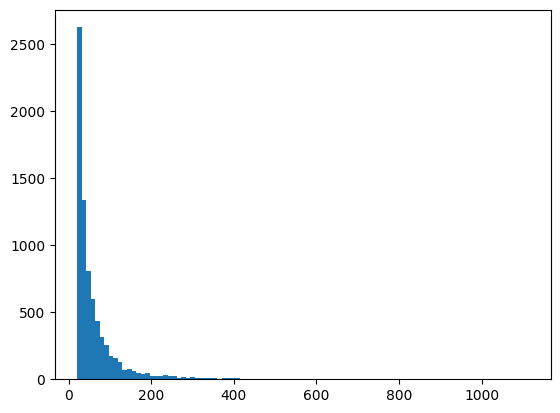

In [ ]:
plt.hist(steamByPairYear.gamesCount[steamByPairYear.gamesCount>20], bins = 100)

In [ ]:
X = steamByPairYear[[
    "year",
    "tagCount1",
    "tagCount2",
    "avgRating1",
    "avgRating2",
    "avgRatingPair",
    "totalReviews1",
    "totalReviews2",
    ]]#.to_numpy()
Y = steamByPairYear["gamesCount"].to_numpy()

In [ ]:
with pm.Model() as model_steam:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X, np.log(Y), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y)
    idata_steam = pm.sample(compute_convergence_checks=False)

Output()

In [ ]:
pm.sample_posterior_predictive(idata_steam,model_steam, extend_inferencedata=True)

Output()

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

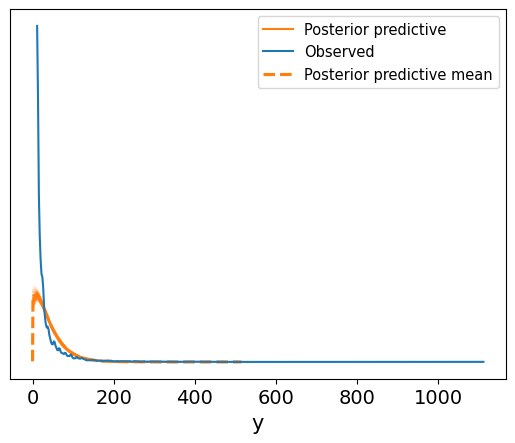

In [ ]:
ax = az.plot_ppc(idata_steam, num_pp_samples=100, colors=["C1", "C0", "C1"])

# Wow this kinds sucks
gamma isn't exactly what I want I think. I could try making an exponential that starts at 20.

In [ ]:
posterior_mean = idata_steam.posterior["μ"]

μ_hdi = az.hdi(ary=idata_steam, group="posterior", var_names=["μ"], hdi_prob=0.74)

pps = az.extract(
    idata_steam, group="posterior_predictive", var_names=["y"]
).T

In [ ]:
pps

<xarray.DataArray 'y' (sample: 2000, y_dim_0: 14751)> Size: 236MB
array([[117.22652987,  16.28453483,  74.15257687, ...,   6.14006209,
         11.25654455,  49.9264855 ],
       [ 20.91294696,   7.7419943 ,   1.77099859, ...,  41.01602929,
         16.17283213,  67.54776847],
       [ 45.03083685,  37.61413896,  38.15619468, ...,   7.53171064,
         25.7723737 ,  42.33589239],
       ...,
       [  1.69223742,  21.99507716,   1.62654   , ...,  25.76311103,
         25.97400238,   8.11594737],
       [  0.53525102,  74.69304587,  16.9627307 , ...,   4.08883603,
        121.25862903, 164.01026223],
       [ 80.84918867,  50.85207409,  24.77314609, ...,  27.68031725,
          7.86032699,   3.86770907]])
Coordinates:
  * y_dim_0  (y_dim_0) int64 118kB 0 1 2 3 4 5 ... 14746 14747 14748 14749 14750
  * sample   (sample) object 16kB MultiIndex
  * chain    (sample) int64 16kB 0 0 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1 1 1
  * draw     (sample) int64 16kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999

In [ ]:
X.year.to_numpy()

array([2006., 2006., 2006., ..., 2024., 2024., 2024.])

/usr/local/lib/python3.11/dist-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


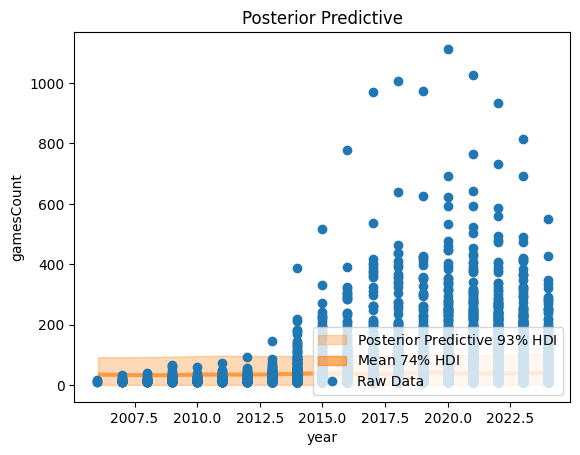

In [ ]:
idx = np.argsort(X.year)
fig, ax = plt.subplots()

az.plot_hdi(
    x=X.year,
    y=pps,
    ax=ax,
    hdi_prob=0.93,
    fill_kwargs={"alpha": 0.3, "label": r"Posterior Predictive $93\%$ HDI"},
)

az.plot_hdi(
    x=X.year,
    y=posterior_mean,
    ax=ax,
    hdi_prob=0.74,
    fill_kwargs={"alpha": 0.6, "label": r"Mean $74\%$ HDI"},
)
ax.plot(steamByPairYear["year"], steamByPairYear["gamesCount"], "o", c="C0", label="Raw Data")
ax.legend(loc="lower right")
ax.set(
    title="Posterior Predictive",
    xlabel="year",
    ylabel="gamesCount",
);

# Again, the prediction is kinda bad. GameCounts for tags are so skewed towards 0 that it doesn't really show anything.

/usr/local/lib/python3.11/dist-packages/pymc_bart/utils.py:516: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='year'>, <Axes: xlabel='tagCount1'>,
       <Axes: xlabel='tagCount2'>, <Axes: xlabel='avgRating1'>,
       <Axes: xlabel='avgRating2'>, <Axes: xlabel='avgRatingPair'>,
       <Axes: xlabel='totalReviews1'>, <Axes: xlabel='totalReviews2'>],
      dtype=object)

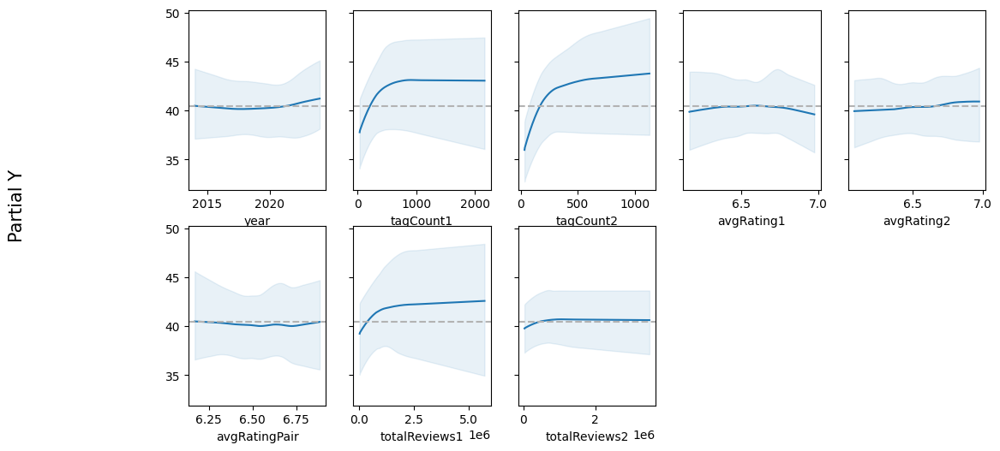

In [ ]:
pmb.plot_pdp(μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

/usr/local/lib/python3.11/dist-packages/pymc_bart/utils.py:516: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='year'>, <Axes: xlabel='tagCount1'>,
       <Axes: xlabel='tagCount2'>, <Axes: xlabel='avgRating1'>,
       <Axes: xlabel='avgRating2'>, <Axes: xlabel='avgRatingPair'>,
       <Axes: xlabel='totalReviews1'>, <Axes: xlabel='totalReviews2'>],
      dtype=object)

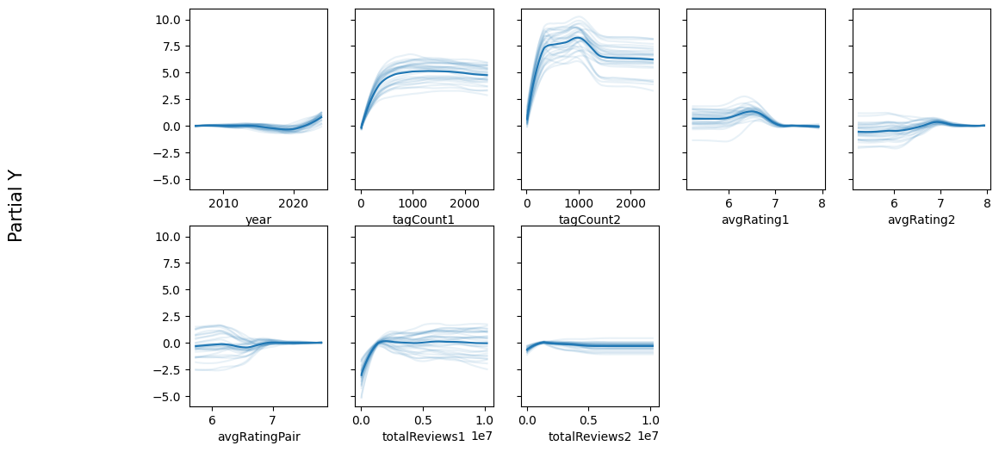

In [ ]:
pmb.plot_ice( μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

# Ice plots
my ice plots are.... wierd. They like kinda don't make any sense at all. Why does Reviews1 have less parallelness than Reviews2? Why does tagCount1 have more parallelness than tagCount2? I think the sorting library I used has some bias towards putting a certain tag first in order, which is changing the weight a lot.

Doesnt seem like theres a lot of interaction going on either.

In [ ]:
vi_steam = pmb.compute_variable_importance(idata_steam, μ_, X)

<Axes: ylabel='R²'>

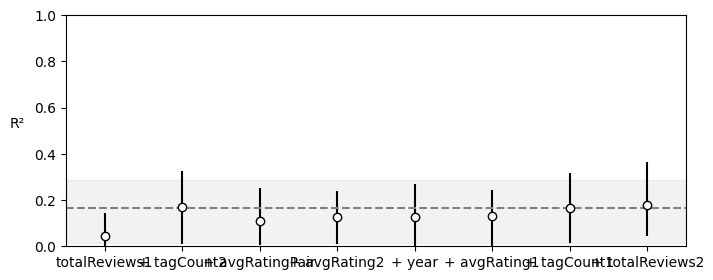

In [ ]:
pmb.plot_variable_importance(vi_steam)

# pmb & conclusions
It seems like tag counts, and total reviews2 are the best for predicting, but it never predicted very well. This is also really wierd, since total reviews1 is really bad.

Yeah this is kinda boring. There is a LOOOTTTT of noise here that makes it really hard to get any interesting results from the model. It does sort of show us that people make kinda similar games a lot. Another factor is the fact that some tags might get introduced over time, and not updated backwards.